# Maximization visualizer

Based on work by [Zeiler and Fergus, 2014](chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://cs.nyu.edu/~fergus/papers/zeilerECCV2014.pdf) this code produces images of activation maximalizations per layer of a trained image classification convolutional network

In [4]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import os
from fastai.vision.all import *

In [5]:
# Load a pretrained/pretuned model to visually analyse
model_name = "googlenet"
model_root = f"models/{model_name}_10x"
model_focus = ["breath", "depth"]
learners = {}
for focus in model_focus:
    learners[focus] = load_learner(f"{model_root}/{focus}.pkl")

In [6]:
for focus in learners:
    device = next(learners[focus].model.parameters()).device
    learners[focus].model.eval()

In [7]:
def get_inception_blocks(model):
    blocks = []
    for name, module in model.named_modules():
        if name == "":
            continue
        children = list(module.children())
        if len(children) >= 2:
            if module.__class__.__name__.lower() == "inception" or "inception" in module.__class__.__name__.lower():
                blocks.append((name, module))
    return blocks

# ----------------------------
# inspect blocks
# ----------------------------
def show_inception_blocks(model):
    blocks = get_inception_blocks(model)
    for i, (n, m) in enumerate(blocks):
        print(f"{i:03d}: {n} -> {m.__class__.__name__} ({len(list(m.children()))} children)")
    return blocks

def get_module_by_name(model, name):
    for n, m in model.named_modules():
        if n == name:
            return m
    raise KeyError(f"Layer not found: {name}")

def total_variation(x):
    return (x[:, :, :, 1:] - x[:, :, :, :-1]).abs().mean() + (x[:, :, 1:, :] - x[:, :, :-1, :]).abs().mean()

def optimize_unit(model, layer_name, channel=0, img_size=224, steps=80, lr=0.05,
                  tv_weight=1e-5, l2_weight=1e-6, jitter=8, clamp=(0, 1)):
    model.eval()
    layer = get_module_by_name(model, layer_name)
    acts = {}

    def hook_fn(m, inp, out):
        acts["value"] = out

    hook = layer.register_forward_hook(hook_fn)

    x = torch.randn(1, 3, img_size, img_size, device=device, requires_grad=True)
    opt = torch.optim.Adam([x], lr=lr)

    for _ in range(steps):
        opt.zero_grad(set_to_none=True)

        if jitter > 0:
            ox = int(torch.randint(-jitter, jitter + 1, (1,), device=device).item())
            oy = int(torch.randint(-jitter, jitter + 1, (1,), device=device).item())
            x_in = torch.roll(x, shifts=(ox, oy), dims=(2, 3))
        else:
            x_in = x

        _ = model(x_in)
        a = acts["value"]

        if a.ndim == 4:
            objective = a[:, channel].mean()
        elif a.ndim == 2:
            objective = a[:, channel].mean()
        else:
            objective = a.mean()

        tv = total_variation(x)
        l2 = x.pow(2).mean()
        loss = -(objective - tv_weight * tv - l2_weight * l2)

        loss.backward()
        opt.step()

        with torch.no_grad():
            x.clamp_(*clamp)

    hook.remove()
    return x.detach().cpu().squeeze(0).permute(1, 2, 0).numpy()

def plot_grid(images, titles, ncols=2, figsize=(10, 10), save_path="output/grid.png"):
    os.makedirs("output", exist_ok=True)
    n = len(images)
    nrows = (n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = axes.flatten() if n > 1 else [axes]

    for ax in axes[n:]:
        ax.axis("off")

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img)
        ax.set_title(title)
        ax.axis("off")

    plt.tight_layout()
    fig.savefig(save_path, dpi=200, bbox_inches="tight")
    plt.show()

def save_image(img, path):
    os.makedirs(os.path.dirname(path), exist_ok=True)
    plt.imsave(path, img)

In [8]:
# list only Inception blocks
blocks = show_inception_blocks(learners[model_focus[0]].model)

if not blocks:
    raise ValueError("No Inception blocks found.")

000: 0.5 -> Inception (4 children)
001: 0.6 -> Inception (4 children)
002: 0.8 -> Inception (4 children)
003: 0.9 -> Inception (4 children)
004: 0.10 -> Inception (4 children)
005: 0.11 -> Inception (4 children)
006: 0.12 -> Inception (4 children)
007: 0.14 -> Inception (4 children)
008: 0.15 -> Inception (4 children)


In [9]:
import random
from pathlib import Path
from fastai.vision.all import *

def get_image_paths(folder):
    return [p for p in Path(folder).glob("*") if p.suffix.lower() in {".jpg", ".jpeg", ".png", ".bmp", ".gif"}]

def random_image_path(folder):
    paths = get_image_paths(folder)
    if not paths:
        raise ValueError(f"No images found in {folder}")
    return random.choice(paths)

def image_to_tensor(path, learn, device):
    img = PILImage.create(path)
    dl = learn.dls.test_dl([img])
    xb = next(iter(dl))[0].to(device)
    return xb

def top_channels_by_mean_activation(model, layer_name, img_tensor, top_n=4):
    layer = get_module_by_name(model, layer_name)
    acts = {}

    def hook_fn(m, inp, out):
        acts["value"] = out.detach()

    hook = layer.register_forward_hook(hook_fn)
    with torch.no_grad():
        _ = model(img_tensor)
    hook.remove()

    a = acts["value"]
    if a.ndim == 4:
        ch_means = a.mean(dim=(0, 2, 3))
    elif a.ndim == 2:
        ch_means = a.mean(dim=0)
    else:
        ch_means = a.flatten()

    vals, idxs = torch.topk(ch_means, k=min(top_n, ch_means.numel()))
    return idxs.tolist(), vals.tolist(), ch_means

In [10]:
learners

{'breath': <fastai.learner.Learner at 0x7b9135d7fb60>,
 'depth': <fastai.learner.Learner at 0x7b9135c0e3c0>}

In [17]:
from settings import categories
image_categories = {}
for axis in categories:
    image_categories[axis] = list(categories[axis].keys())
image_categories

{'depth': ['iconic', 'symbolic'], 'breath': ['abstract', 'concrete']}

In [13]:
for focus, learn in learners.items():
    model = learn.model
    model.eval()

    xb = next(iter(learn.dls.test_dl([
        PILImage.create(random_image_path(f"artefacts/{focus}/"
                                           f"{image_categories[focus][0]}"))
    ])))[0].to(device)

    with torch.no_grad():
        out = model(xb)

    print(f"{focus}: output shape = {tuple(out.shape)}")
    print(f"{focus}: output = {out.detach().cpu()}")
    print(f"{focus}: vocab = {getattr(learn.dls, 'vocab', None)}")

breath: output shape = (1, 2)
breath: output = TensorImage([[  9.6332, -12.3590]])
breath: vocab = ['abstract', 'concrete']
depth: output shape = (1, 2)
depth: output = TensorImage([[ 0.1940, -2.5856]])
depth: vocab = ['iconic', 'symbolic']


Visualizing block 0: 0.5
Top channels for A: [198, 19, 39, 52] [2.9592204093933105, 2.8444759845733643, 2.7694876194000244, 2.711059331893921]
Top channels for B: [52, 198, 15, 39] [2.9873287677764893, 2.9543681144714355, 2.914447546005249, 2.880366802215576]


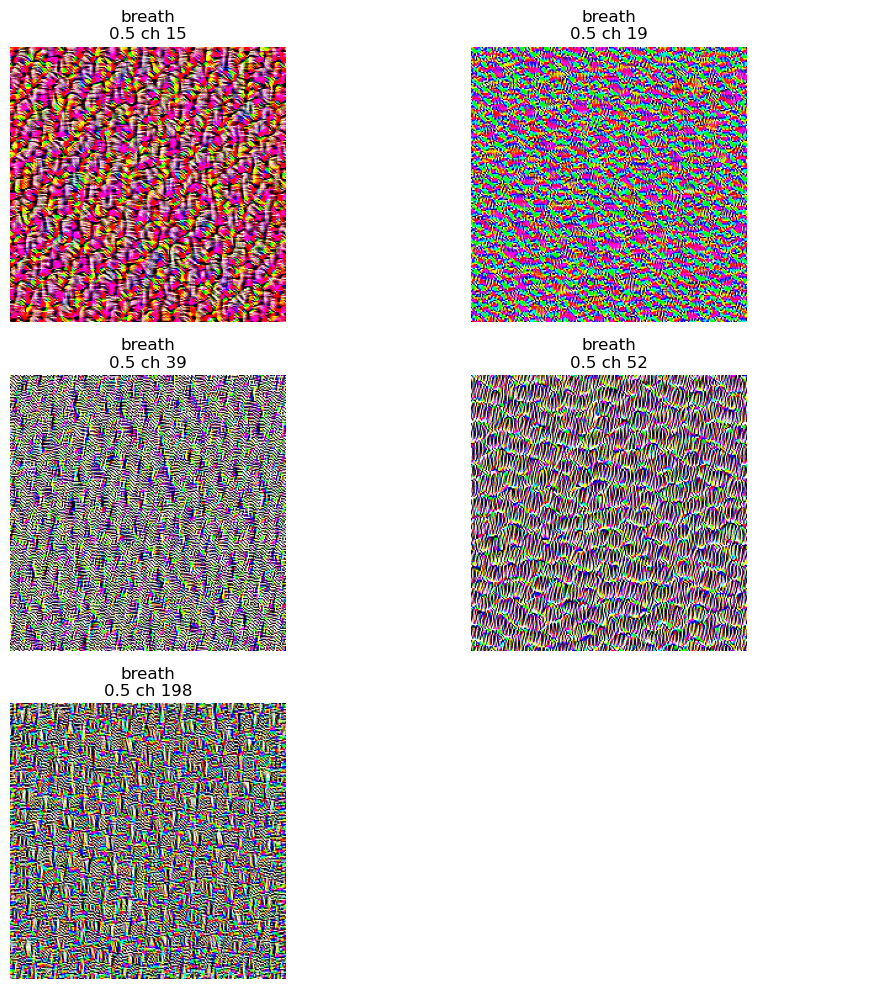

Visualizing block 1: 0.6
Top channels for A: [80, 36, 456, 422] [2.081465482711792, 1.9681286811828613, 1.9499980211257935, 1.9298052787780762]
Top channels for B: [50, 73, 29, 19] [2.843386650085449, 2.639643430709839, 2.5441980361938477, 2.245332717895508]


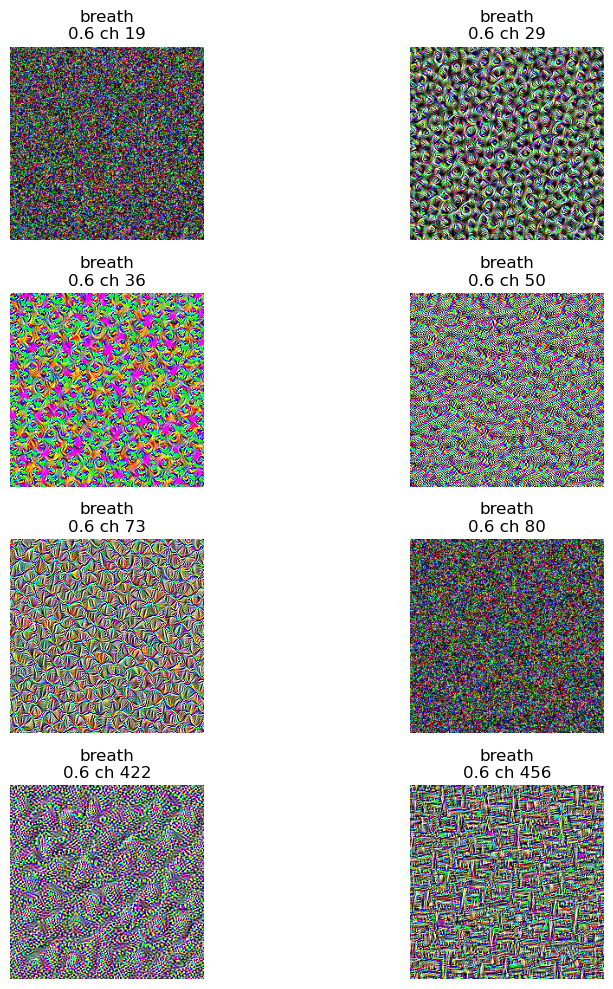

Visualizing block 2: 0.8
Top channels for A: [415, 463, 500, 499] [2.032254695892334, 1.6457901000976562, 1.6395814418792725, 1.4862914085388184]
Top channels for B: [415, 463, 157, 488] [2.529381513595581, 1.7085925340652466, 1.423979640007019, 1.388383388519287]


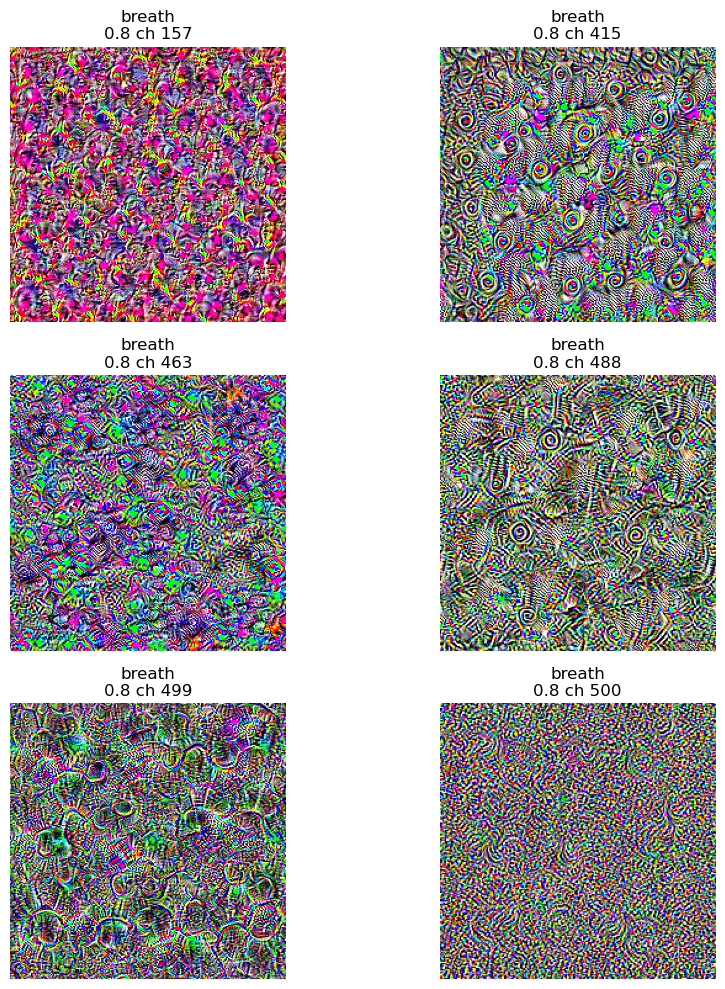

Visualizing block 3: 0.9
Top channels for A: [85, 154, 137, 76] [3.2949492931365967, 2.8942599296569824, 2.695132255554199, 2.691059112548828]
Top channels for B: [85, 77, 137, 75] [3.698070764541626, 2.848588228225708, 2.740744113922119, 2.5996646881103516]


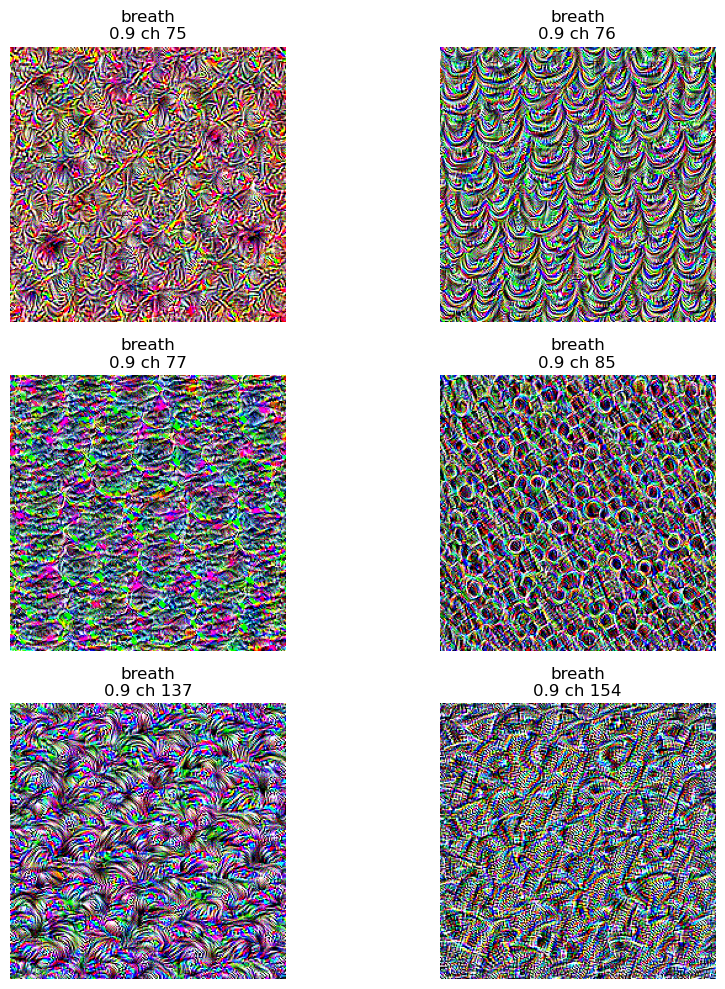

Visualizing block 4: 0.10
Top channels for A: [31, 20, 86, 75] [2.4641687870025635, 2.3972089290618896, 2.3899827003479004, 1.7729921340942383]
Top channels for B: [20, 31, 86, 5] [2.7169387340545654, 2.386270761489868, 2.1310927867889404, 2.0879311561584473]


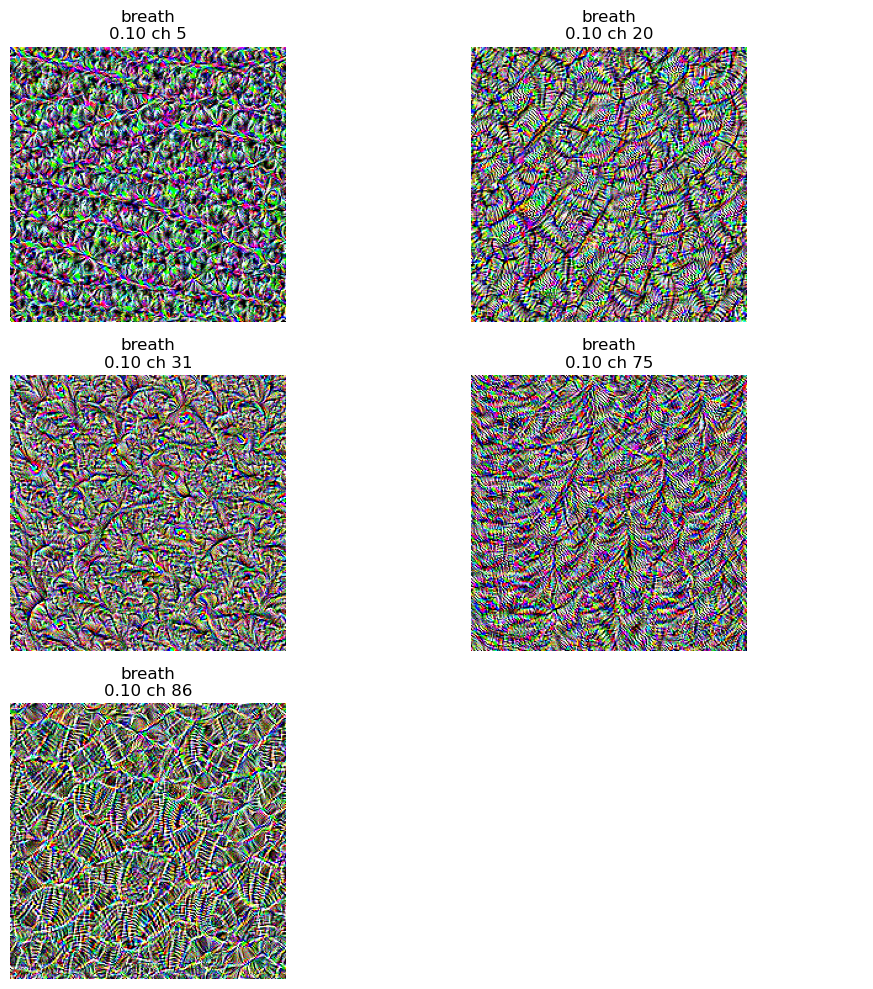

Visualizing block 5: 0.11
Top channels for A: [62, 29, 460, 80] [2.6442670822143555, 1.5090488195419312, 1.1658517122268677, 1.1312708854675293]
Top channels for B: [62, 460, 90, 33] [2.4749581813812256, 1.0945252180099487, 1.0822745561599731, 0.896183967590332]


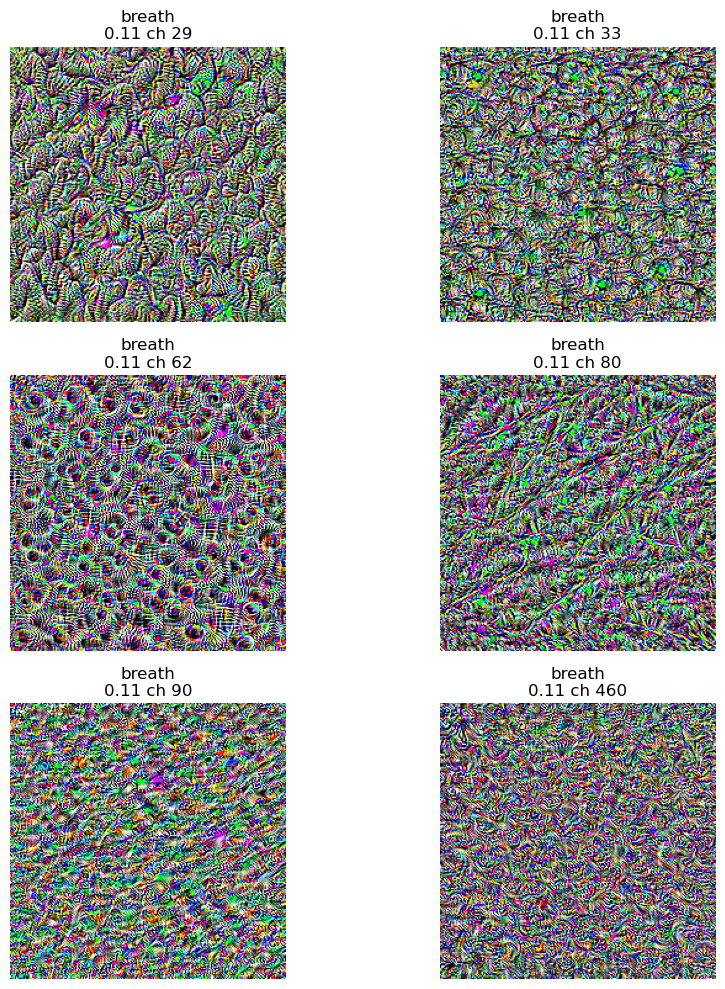

Visualizing block 6: 0.12
Top channels for A: [828, 795, 809, 729] [1.0774427652359009, 0.9892896413803101, 0.8348322510719299, 0.6438673734664917]
Top channels for B: [751, 687, 724, 763] [0.7915594577789307, 0.655852735042572, 0.6100388169288635, 0.5445571541786194]


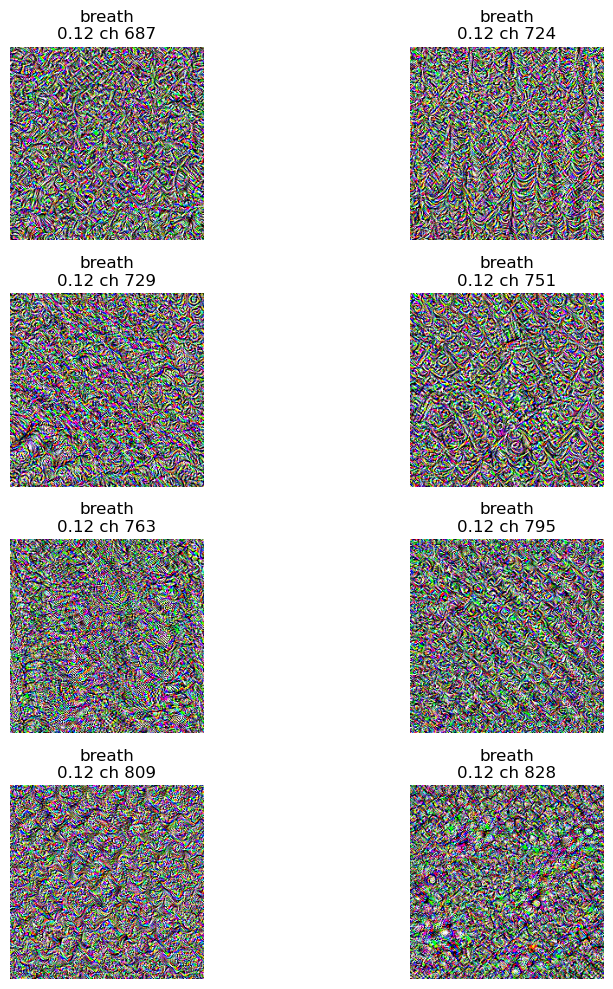

Visualizing block 7: 0.14
Top channels for A: [763, 590, 624, 617] [1.6392369270324707, 1.4237966537475586, 1.2355977296829224, 1.1993458271026611]
Top channels for B: [585, 219, 707, 774] [1.3388651609420776, 0.9323131442070007, 0.9210399389266968, 0.7233239412307739]


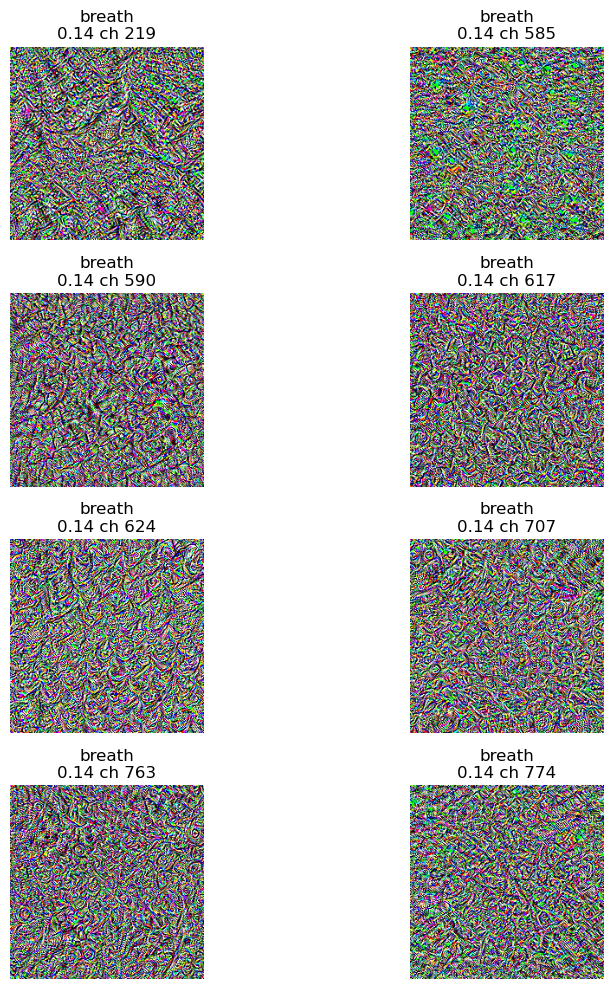

Visualizing block 8: 0.15
Top channels for A: [249, 48, 359, 192] [3.4922518730163574, 2.7524831295013428, 2.402019739151001, 2.2428741455078125]
Top channels for B: [745, 749, 123, 788] [2.2479138374328613, 1.845717430114746, 1.819873571395874, 1.7241462469100952]


In [ ]:
for focus in learners:
    learn = learners[focus]
    folder = f"artefacts/{focus}"
    categories = image_categories[focus]

    path_a = random_image_path(f"{folder}/{image_categories[focus][0]}")
    path_b = random_image_path(f"{folder}/{image_categories[focus][1]}")

    img_a = image_to_tensor(path_a, learn, device)
    img_b = image_to_tensor(path_b, learn, device)

    for idx, (layer_name, module) in enumerate(blocks):
        print(f"Visualizing block {idx}: {layer_name}")
        images = []
        titles = []

        channels_a, scores_a, _ = top_channels_by_mean_activation(learn.model, layer_name, img_a, top_n=4)
        channels_b, scores_b, _ = top_channels_by_mean_activation(learn.model, layer_name, img_b, top_n=4)

        print("Top channels for A:", channels_a, scores_a)
        print("Top channels for B:", channels_b, scores_b)

        selected_channels = sorted(set(channels_a + channels_b))

        for ch in selected_channels:
            img = optimize_unit(
                learn.model,
                layer_name=layer_name,
                channel=ch,
                img_size=224,
                steps=60,
                lr=0.08,
                tv_weight=1e-5,
                l2_weight=1e-6,
                jitter=8
            )
            images.append(img)
            titles.append(f"{focus}\n{layer_name} ch {ch}")

        save_root = f"visualizations/{model_name}/{focus}"
        save_path = f"{save_root}/inception_block_{idx:02d}.png"
        plot_grid(images, titles, ncols=2, figsize=(10, 10), save_path=save_path)

        for i, img in enumerate(images):
            save_image(img, f"{save_root}/{layer_name.replace('.', '_')}_ch{selected_channels[i]}.png")
